In [3]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import pandas as pd
import palettable
import matplotlib as mpl
import sdeint
import pycatch22 as catch22
from sklearn.manifold import TSNE
import random
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from sklearn.decomposition import PCA
from umap import UMAP
import pickle
import matplotlib.colors as colors

In [5]:
np.random.seed(0)
num_samples = 5000 # 57 mins
eta_val_hopf = np.random.uniform(0.01, 0.7, size = num_samples)
mu_val_hopf = np.random.uniform(-5,5, size = num_samples)
sols_list = list()
dt = 0.01
tspan = np.arange(0, 55, dt)
for i in range(num_samples):
    if (i+1)%100 == 0:
        print(f'{i+1}/{num_samples}')
    mu = mu_val_hopf[i]
    eta = eta_val_hopf[i]
    def f(state, t):
        x, y = state[0], state[1]
        dxdt = -y + (mu - x **2 - y**2) * x
        dydt = x + (mu - x ** 2 - y **2) * y
        return dxdt, dydt
    ic = np.array(np.random.uniform(size=2)) # uniform random initial conditions
    gw = lambda y, t: eta * np.identity(ic.shape[0]) # noise is relative to ic's 
    fw = lambda y, t: np.array(f(y,t))
    sol = sdeint.itoint(fw, gw, np.array(ic), tspan)
    sols_list.append(sol[500:]) # cut out first 500 time points

100/5000
200/5000
300/5000
400/5000
500/5000
600/5000
700/5000
800/5000
900/5000
1000/5000
1100/5000
1200/5000
1300/5000
1400/5000
1500/5000
1600/5000
1700/5000
1800/5000
1900/5000
2000/5000
2100/5000
2200/5000
2300/5000
2400/5000
2500/5000
2600/5000
2700/5000
2800/5000
2900/5000
3000/5000
3100/5000
3200/5000
3300/5000
3400/5000
3500/5000
3600/5000
3700/5000
3800/5000
3900/5000
4000/5000
4100/5000
4200/5000
4300/5000
4400/5000
4500/5000
4600/5000
4700/5000
4800/5000
4900/5000
5000/5000


In [6]:
TS_hopf = np.array([sols_list[i][:,0] for i in range(len(sols_list))]) # extract x component
FEATURES_hopf = np.array([catch22.catch22_all(TS_hopf[i,:])['values'] for i in range(len(sols_list))])

In [7]:
normalized_features = StandardScaler().fit_transform(FEATURES_hopf)
pca_reducer = PCA(n_components=2)
embedding = pca_reducer.fit_transform(normalized_features)

In [8]:
np.random.seed(643)
num_samples = 5000 # 49 mins
eta_val_bist = np.random.uniform(0.01, 0.7, size=num_samples)
mu_val_bist = np.random.uniform(-5, 5, size=num_samples)
sols_list = list()
dt = 0.01
tspan = np.arange(0, 55, dt)
for i in range(num_samples):
    if (i+1)%100 == 0:
        print(f'{i+1}/{num_samples}')
    mu = mu_val_bist[i] # uniform random mu value
    eta = eta_val_bist[i] # uniform random eta value
    def f(state, t):
        x = state
        dxdt = mu + x - x**3
        return dxdt 
    ic = np.array([np.random.uniform()]) # uniform random initial conditions
    gw = lambda y, t: eta * np.identity(ic.shape[0]) # noise is relative to ic's 
    fw = lambda y, t: np.array(f(y,t))
    sol = sdeint.itoint(fw, gw, np.array(ic), tspan)
    sols_list.append(sol[500:]) # cut out first 500 time points

100/5000
200/5000
300/5000
400/5000
500/5000
600/5000
700/5000
800/5000
900/5000
1000/5000
1100/5000
1200/5000
1300/5000
1400/5000
1500/5000
1600/5000
1700/5000
1800/5000
1900/5000
2000/5000
2100/5000
2200/5000
2300/5000
2400/5000
2500/5000
2600/5000
2700/5000
2800/5000
2900/5000
3000/5000
3100/5000
3200/5000
3300/5000
3400/5000
3500/5000
3600/5000
3700/5000
3800/5000
3900/5000
4000/5000
4100/5000
4200/5000
4300/5000
4400/5000
4500/5000
4600/5000
4700/5000
4800/5000
4900/5000
5000/5000


In [9]:
TS_bistable = np.array([sols_list[i][:,0] for i in range(len(sols_list))]) # extract x component
FEATURES_Bistable = np.array([catch22.catch22_all(TS_bistable[i,:])['values'] for i in range(len(sols_list))])

In [10]:
np.random.seed(42)
num_samples = 5000
eta_val_hookes = np.random.uniform(0.01, 0.7, size=num_samples)
mu_val_hookes = np.random.uniform(-1.02, -0.98, size=num_samples)
sols_list = list()
dt = 0.01
tspan = np.arange(0,55, dt)
for i in range(num_samples):
    if (i+1)%1000 == 0:
        print(f'{i+1}/{num_samples}')
    eta = eta_val_hookes[i]
    mu = mu_val_hookes[i]
    def f(state, t):
        x = state[0]
        dxdt = mu*x
        return dxdt
    ic = np.array([np.random.uniform()])
    gw = lambda y, t: eta * np.identity(ic.shape[0])
    fw = lambda y, t: np.array(f(y,t))
    sol = sdeint.itoint(fw, gw, np.array([ic]), tspan)
    sols_list.append(sol[500:]) # cut out first 500 time points

1000/5000
2000/5000
3000/5000
4000/5000
5000/5000


In [11]:
TS_hookes = np.array([sols_list[i][:,0] for i in range(len(sols_list))]) # extract x component
FEATURES_hookes = np.array([catch22.catch22_all(TS_hookes[i,:])['values'] for i in range(len(sols_list))])

In [13]:
FEATURES_COMBINED = np.vstack([FEATURES_Bistable, FEATURES_hopf, FEATURES_hookes])

In [228]:
normalized_features = StandardScaler().fit_transform(FEATURES_COMBINED)
pca_reducer = PCA(n_components=2)
embedding = pca_reducer.fit_transform(normalized_features)

In [229]:
df_bistable = pd.DataFrame(embedding[:10000])
df_bistable['mu'] = mu_val_bist
df_bistable['eta'] = eta_val_bist
df_bistable['system'] = 'Bistable'
df_hopf = pd.DataFrame(embedding[10000:20000])
df_hopf['mu'] = mu_val_hopf
df_hopf['eta'] = eta_val_hopf
df_hopf['system'] = 'Hopf'
df_hookes = pd.DataFrame(embedding[20000:])
df_hookes['mu'] = hookes_params[0, :]
df_hookes['eta'] = hookes_params[1,:]
df_hookes['system'] = 'Hookes'
df = pd.concat([df_bistable, df_hopf, df_hookes])

In [230]:
df.to_pickle('combined_instance_space.pkl')

In [231]:
symbols = ['circle', 'square', 'cross']
fig = px.scatter(df, x=0, y=1, color=df["mu"], template="plotly_dark", size='eta',
    labels={'0': 'PC1', '1': 'PC2', 'color': r"$\lambda$"}, width=1200, height=800, symbol = df["system"],symbol_sequence=symbols, custom_data=['mu', 'eta', 'system', df.index], color_continuous_scale='Jet')
fig.update_traces(
    hovertemplate="<br>".join([
        "Mu: %{customdata[0]:.3f}",
        "Eta: %{customdata[1]:.3f}",
        "System: %{customdata[2]}",
        "TS Index: %{customdata[3]}"
    ])
)
fig.update_layout(
    legend=dict(
        title = "System",
        x=0,
        y=1,
        traceorder="reversed",
        font=dict(
            family="Open Sans",
            size=12,
            color="black"
        ),
        bgcolor="White",
        bordercolor="Black",
        borderwidth=2,
        itemsizing = "constant"
    ))
fig.update_traces(marker=dict(size=3))
fig.update_layout(title_text='Catch22 Instance Space, PCA', title_x=0.5)

fig.show()

initial test for model selection - comparison between hopf fixed point and Hooke's Law noisy fixed point

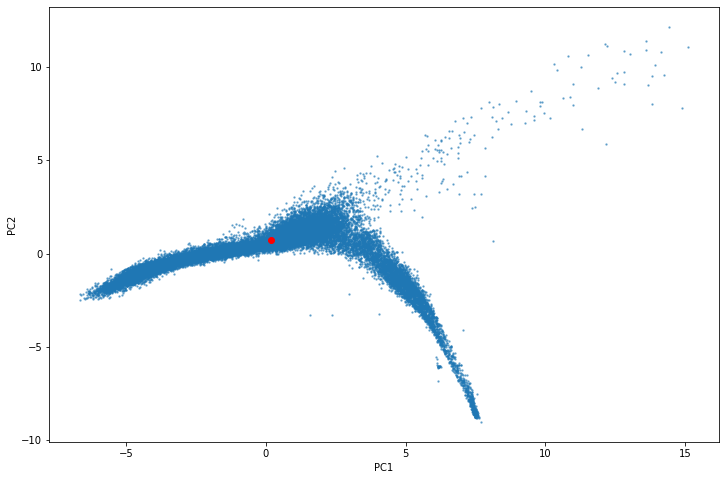

In [232]:
test_point_embedding = [0.2, 0.7]
plt.figure(figsize=(12,8))
plt.scatter(df[0], df[1], alpha=0.5,s=2)
plt.scatter(test_point_embedding[0], test_point_embedding[1], c='r')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

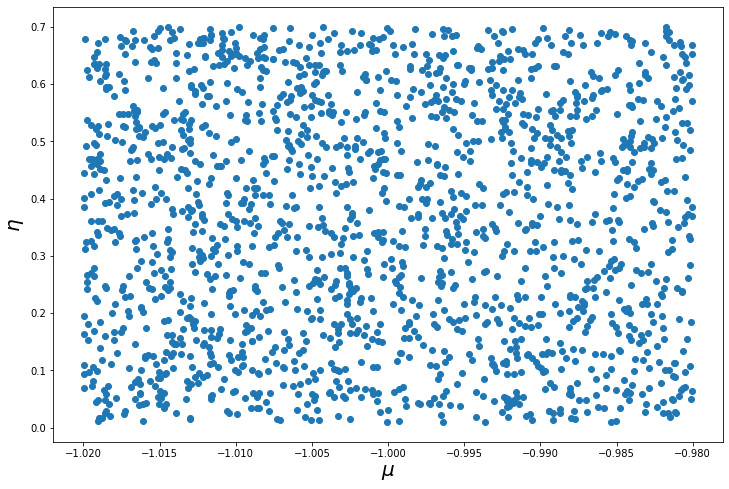

In [233]:
radius = 0.5 # sqrt (x-x1)^2 + (y-y1)^2 <= 0.2
interest = df[(np.sqrt((df[0]-test_point_embedding[0])**2 + (df[1]-test_point_embedding[1])**2) < radius) & (df["system"] == 'Hookes')] 
mus = interest["mu"]
etas = interest["eta"]
plt.figure(figsize=(12,8))
plt.scatter(mus, etas)
plt.xlabel(r'$\mu$', fontsize=20)
plt.ylabel(r'$\eta$', fontsize=20)
plt.show()

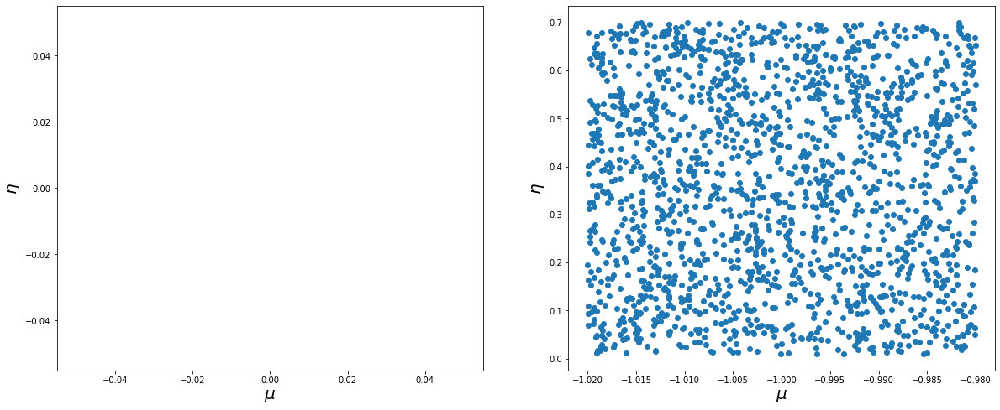

In [234]:
mu_pos = interest[mus > 0]
mu_neg = interest[mus < 0]
fig, ax = plt.subplots(1, 2, figsize=(20,8))
ax[0].scatter(mu_pos['mu'], mu_pos['eta'])
ax[0].set_xlabel(r'$\mu$', fontsize=20)
ax[0].set_ylabel(r'$\eta$', fontsize=20)
ax[1].scatter(mu_neg['mu'], mu_neg['eta'])
ax[1].set_xlabel(r'$\mu$', fontsize=20)
ax[1].set_ylabel(r'$\eta$', fontsize=20)
plt.show()

Lets just look at positive mu branch

In [235]:
bins = 10 # sufficient glanularity?
heatmap, x_edges, y_edges = np.histogram2d(interest['mu'], interest['eta'], bins=bins)
heatmap /= len(interest)
x_vals = [(x_edges[i] + x_edges[i+1])/ 2 for i in range(bins)]
y_vals = [(y_edges[i] + y_edges[i+1])/ 2 for i in range(bins)]

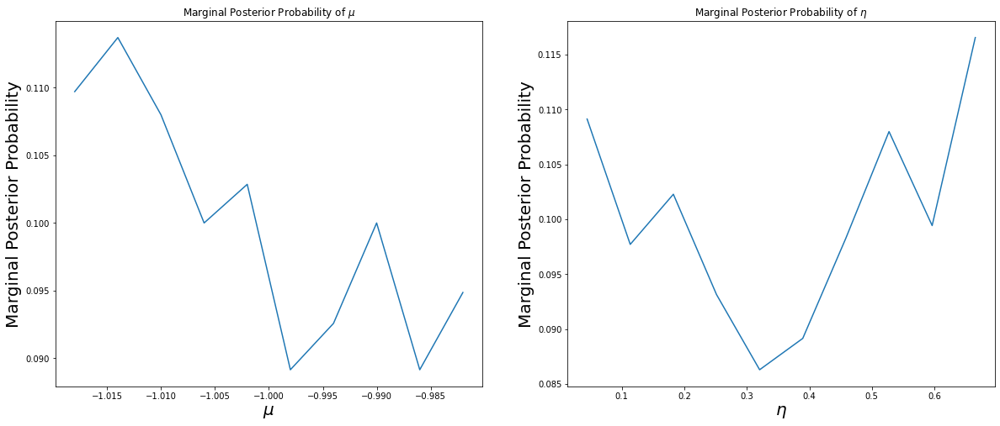

In [236]:
fig, ax = plt.subplots(1, 2, figsize=(20,8))
ax[0].plot(x_vals, heatmap.sum(axis=1))
ax[0].set_xlabel('$\mu$', fontsize=20)
ax[1].plot(y_vals, heatmap.sum(axis=0))
ax[1].set_xlabel('$\eta$', fontsize=20)
ax[0].set_title('Marginal Posterior Probability of $\mu$')
ax[1].set_title('Marginal Posterior Probability of $\eta$')
ax[0].set_ylabel('Marginal Posterior Probability', fontsize=20)
ax[1].set_ylabel('Marginal Posterior Probability', fontsize=20)
plt.savefig('c_dist.png')

In [237]:
def expected_value(values, probabilities):
    return sum([v * p for v, p in zip(values, probabilities)])
print(f'Expected Value mu: {expected_value(x_vals, heatmap.sum(axis=1)):.4f}')
print(f'Expected Value eta: {expected_value(y_vals, heatmap.sum(axis=0)):.4f}')

Expected Value mu: -1.0008
Expected Value eta: 0.3593


## Model comparison

In [238]:
radius = 0.5 # sqrt (x-x1)^2 + (y-y1)^2 <= 0.2
test_point_embedding = [0.2, 0.7] # lies within footprint of bistable, Hopf and Hookes System (0.2, 0.7)
interest = df[(np.sqrt((df[0]-test_point_embedding[0])**2 + (df[1]-test_point_embedding[1])**2) < radius)] 
interest['system'].unique()

array(['Bistable', 'Hopf', 'Hookes'], dtype=object)

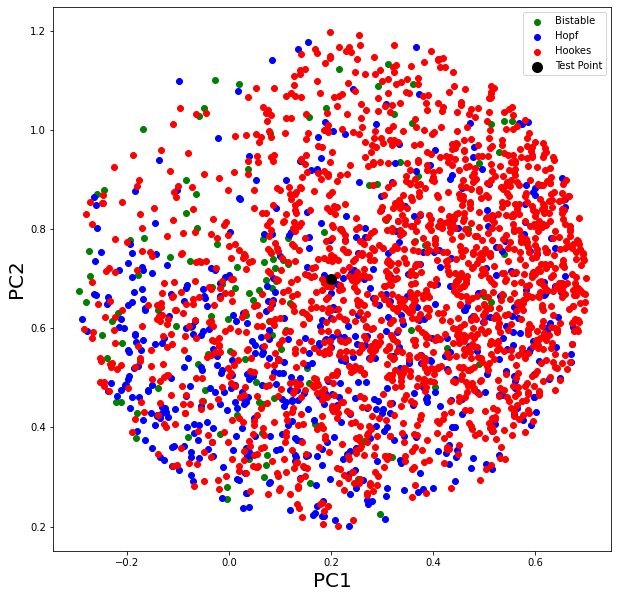

In [239]:
plt.figure(figsize=(10,10))
plt.scatter(interest[interest['system'] == 'Bistable'][0], interest[interest['system'] == 'Bistable'][1], color='green', label='Bistable')
plt.scatter(interest[interest['system'] == 'Hopf'][0], interest[interest['system'] == 'Hopf'][1], color='blue', label='Hopf')
plt.scatter(interest[interest['system'] == 'Hookes'][0], interest[interest['system'] == 'Hookes'][1], color='red', label='Hookes')
plt.scatter(test_point_embedding[0], test_point_embedding[1], color='k', s=100, label='Test Point')
plt.xlabel('PC1', fontsize=20)
plt.ylabel('PC2', fontsize=20)
plt.legend()
plt.show()

In [240]:
print('Hopf: ',len(interest[(interest["system"] == 'Hopf')]))
print('Bistable: ',len(interest[(interest["system"] == 'Bistable')]))
print('Hookes: ',len(interest[(interest["system"] == 'Hookes')]))


Hopf:  573
Bistable:  130
Hookes:  1750


### Another attempt at rescaling...
Robust scaling essentially subtracts the median and rescales according to the interquartile range (IQR) between the first quartile (25th quantile) and 3rd quartile (75 quantile) which is esentially the middle 50% portion. Feed the result into a sigmoid and squish to between 0 and 1. Can adjust the sharpness of the transition as needed. Then z-score and apply PCA.

In [15]:
FEATURES_COMBINED.shape

(15000, 22)

IQR Rescaling

In [16]:
rs = RobustScaler()
rs.fit(FEATURES_COMBINED)
iqr_scaling = rs.transform(FEATURES_COMBINED)

In [665]:
iqr_scaling.shape

(30000, 22)

Sigmoidal Squishing - theta is a tunable parameter which adjusts the sharpness of the sigmoid transition

In [17]:
def sigmoid(x, theta):
    return 1/(1+np.exp(-theta*x))

In [18]:
sigmoidal_iqr = np.zeros(iqr_scaling.shape)

In [19]:
for feature in range(22):
    x = iqr_scaling[:,feature]
    sigmoidal_iqr[:, feature] = sigmoid(x, 1.35) # theta = 1.35

Z-score or min-max

In [20]:
ss = StandardScaler()
ss.fit(sigmoidal_iqr)
zscr_sigmoid_iqr = ss.transform(sigmoidal_iqr)
mm_sigmoid_iqr = MinMaxScaler().fit_transform(sigmoidal_iqr)

Using min-max as final step

In [21]:
embedding_mm = pca_reducer.fit_transform(mm_sigmoid_iqr)
embedding_zscr = pca_reducer.fit_transform(zscr_sigmoid_iqr)

In [22]:
pca_reducer = PCA(n_components=2)
pca_reducer.fit(zscr_sigmoid_iqr)
embedding_zscr = pca_reducer.transform(zscr_sigmoid_iqr)

In [25]:
df_bistable = pd.DataFrame(embedding_mm[:5000])
df_bistable['mu'] = mu_val_bist
df_bistable['eta'] = eta_val_bist
df_bistable['system'] = 'Bistable'
df_hopf = pd.DataFrame(embedding_mm[5000:10000])
df_hopf['mu'] = mu_val_hopf
df_hopf['eta'] = eta_val_hopf
df_hopf['system'] = 'Hopf'
df_hookes = pd.DataFrame(embedding_mm[10000:])
df_hookes['mu'] = mu_val_hookes
df_hookes['eta'] = eta_val_hookes
df_hookes['system'] = 'Hookes'
df_minmax = pd.concat([df_bistable, df_hopf, df_hookes])

In [26]:
symbols = ['circle', 'square', 'cross']
fig = px.scatter(df_minmax, x=0, y=1, color=df["mu"], template="plotly_dark", size='eta',
    labels={'0': 'PC1', '1': 'PC2', 'color': r"$\lambda$"}, width=1200, height=800, symbol = df["system"],symbol_sequence=symbols, custom_data=['mu', 'eta', 'system', df.index], color_continuous_scale='Jet')
fig.update_traces(
    hovertemplate="<br>".join([
        "Mu: %{customdata[0]:.3f}",
        "Eta: %{customdata[1]:.3f}",
        "System: %{customdata[2]}",
        "TS Index: %{customdata[3]}"
    ])
)
fig.update_layout(
    legend=dict(
        title = "System",
        x=0,
        y=1,
        traceorder="reversed",
        font=dict(
            family="Open Sans",
            size=12,
            color="black"
        ),
        bgcolor="White",
        bordercolor="Black",
        borderwidth=2,
        itemsizing = "constant"
    ))
fig.update_traces(marker=dict(size=3))
fig.update_layout(title_text='Catch22 Instance Space, PCA', title_x=0.5)

fig.show()

NameError: name 'df' is not defined

Using Z-score as final step

In [674]:
df_bistable = pd.DataFrame(embedding_zscr[:10000])
df_bistable['mu'] = mu_val_bist
df_bistable['eta'] = eta_val_bist
df_bistable['system'] = 'Bistable'
df_hopf = pd.DataFrame(embedding_zscr[10000:20000])
df_hopf['mu'] = mu_val_hopf
df_hopf['eta'] = eta_val_hopf
df_hopf['system'] = 'Hopf'
df_hookes = pd.DataFrame(embedding_zscr[20000:])
df_hookes['mu'] = hookes_params[0, :]
df_hookes['eta'] = hookes_params[1,:]
df_hookes['system'] = 'Hookes'
df_zscr = pd.concat([df_bistable, df_hopf, df_hookes])

In [675]:
symbols = ['circle', 'square', 'cross']
fig = px.scatter(df_zscr, x=0, y=1, color=df["mu"], template="plotly_dark", size='eta',
    labels={'0': 'PC1', '1': 'PC2', 'color': r"$\lambda$"}, width=1200, height=800, symbol = df["system"],symbol_sequence=symbols, custom_data=['mu', 'eta', 'system', df.index], color_continuous_scale='Turbo')
fig.update_traces(
    hovertemplate="<br>".join([
        "Mu: %{customdata[0]:.3f}",
        "Eta: %{customdata[1]:.3f}",
        "System: %{customdata[2]}",
        "TS Index: %{customdata[3]}"
    ])
)
fig.update_layout(
    legend=dict(
        title = "System",
        x=0,
        y=1,
        traceorder="reversed",
        font=dict(
            family="Open Sans",
            size=12,
            color="black"
        ),
        bgcolor="White",
        bordercolor="Black",
        borderwidth=2,
        itemsizing = "constant"
    ))
fig.update_traces(marker=dict(size=3))
fig.update_layout(title_text='Catch22 Instance Space, PCA', title_x=0.5)

fig.show()

Create some better looking static plots:
- One color for each system
- Discrete colour gradient from pale to itense based on value of mu
- Maker size prop. to noise value

In [655]:
rescaled_sizes = df_zscr['eta']/df_zscr['eta'].max() * 10

In [656]:
fig = px.scatter(df_zscr, x=0, y=1, template="plotly_dark", title='Catch22 Instance Space',
    labels={'0': 'PC1', '1': 'PC2', 'color': r"$\lambda$"}, width=1200, height=800)
fig.update_layout(title_text='Catch22 Instance Space', title_x=0.5)
fig.update_traces(marker=dict(size=rescaled_sizes, color=df_zscr['mu']))
fig.show()

In [657]:
import plotly.graph_objects as go

In [28]:
hopf_trace = df_minmax[df_minmax['system'] == 'Hopf']
hookes_trace = df_minmax[df_minmax['system'] == 'Hookes']
bistable_trace = df_minmax[df_minmax['system'] == 'Bistable']

In [677]:
fig = px.scatter(hopf_trace, x=0, y=1, template="plotly_dark", title='Catch22 Instance Space', color=hopf_trace['mu'],
    labels={'0': 'PC1', '1': 'PC2', 'color': r"$\lambda$"}, width=1200, height=800, color_continuous_scale=px.colors.sequential.Oranges)
fig.update_traces(marker=dict(size=hopf_trace['eta']*10))
fig.layout.coloraxis.colorbar.x = 1.1
fig.update_layout(title_text='Catch22 Instance Space', title_x=0.5)
fig.add_trace(go.Scatter(x=hookes_trace[0], y=hookes_trace[1],mode='markers', marker=dict(size=hookes_trace['eta']*10,
                color=hookes_trace['mu'], colorscale=px.colors.sequential.PuBu, showscale=True)))
fig.show()

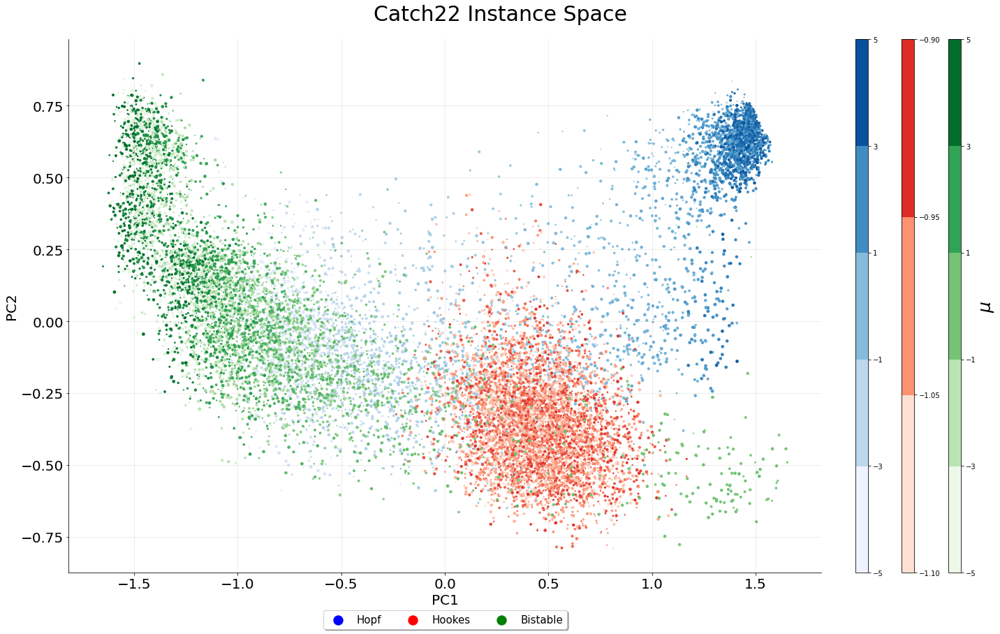

In [87]:
fig, (ax, cax1, cax2, cax3) = plt.subplots(ncols=4,figsize=(20,12), 
                  gridspec_kw={"width_ratios":[1.5, 0.025, 0.025, 0.025]})
cmap_hopf = palettable.colorbrewer.sequential.Blues_6.mpl_colormap
bounds_hopf = [-5, -3, -1, 1, 3, 5]
norm = mpl.colors.BoundaryNorm(bounds_hopf, cmap_hopf.N)
pa = ax.scatter(hopf_trace[0], hopf_trace[1], s=hopf_trace['eta']*20, c=hopf_trace['mu'], cmap=cmap_hopf, label='Hopf')
cba = plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap_hopf), cax=cax1)

cmap_hookes = palettable.colorbrewer.sequential.Reds_3.mpl_colormap
bounds_hookes = [-1.1, -1.05, -0.95, -0.9]
norm = mpl.colors.BoundaryNorm(bounds_hookes, cmap_hookes.N)
pb = ax.scatter(hookes_trace[0], hookes_trace[1], s=hookes_trace['eta']*20, c=hookes_trace['mu'], cmap=cmap_hookes, label='Hookes')
cbb = plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap_hookes), cax=cax2)

cmap_bistable = palettable.colorbrewer.sequential.Greens_5.mpl_colormap
bounds_bistable = [-5, -3, -1, 1, 3, 5] 
norm = mpl.colors.BoundaryNorm(bounds_bistable, cmap_bistable.N)
pc = ax.scatter(bistable_trace[0], bistable_trace[1], s=bistable_trace['eta']*20, c=bistable_trace['mu'], cmap=cmap_bistable, label='Bistable')
cbc = plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap_bistable), cax=cax3).set_label('$\mu$', fontsize=25)
ax.grid(color='k', linestyle='-', linewidth=0.7, alpha=0.1)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.06),
#          fancybox=True, shadow=True, ncol=3, markerscale=10)
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.06),
         fancybox=True, shadow=True, ncol=3, markerscale=5, fontsize=15)

leg = ax.get_legend()
leg.legendHandles[0].set_color('Blue')
leg.legendHandles[1].set_color('Red')
leg.legendHandles[2].set_color('Green')
plt.suptitle('Catch22 Instance Space', fontsize=30, y=1.04)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.set_xlabel('PC1', fontsize=20)
ax.set_ylabel('PC2', fontsize=20)
fig.tight_layout()
plt.savefig('proto.svg', bbox_inches='tight')
plt.show()

Now, rs (robust scaler) and ss (standard scaler) has been fit (along with PC weights), we can use them for projecting new data into the space. 

### Epsilon Calculation

In [739]:
from sklearn.metrics import pairwise_distances
from scipy import stats

Project new test point into space to test the saved weightings. First, we will start with identical mu. 

In [720]:
np.random.seed(0)
mu = -1
eta = 0.5
num_samples = 200
sols_test_list = list()
dt = 0.01
tspan = np.arange(0, 55, dt)
def f(state, t):
    x, y = state[0], state[1]
    dxdt = -y + (mu - x **2 - y**2) * x
    dydt = x + (mu - x ** 2 - y **2) * y
    return dxdt, dydt
for i in range(num_samples):
    ic = np.array(np.random.uniform(size=2)) # uniform random initial conditions
    gw = lambda y, t: eta * np.identity(ic.shape[0]) # noise is relative to ic's 
    fw = lambda y, t: np.array(f(y,t))
    sol = sdeint.itoint(fw, gw, np.array(ic), tspan)
    sols_test_list.append(sol[500:]) # cut out first 500 time points

In [722]:
TS_test = np.array([sols_test_list[i][:,0] for i in range(len(sols_test_list))]) # extract x component
FEATURES_TEST = np.array([catch22.catch22_all(TS_test[i,:])['values'] for i in range(len(sols_test_list))])
iqr_scaled_test = rs.transform(FEATURES_TEST)
sigmoidal_iqr_test = np.zeros(iqr_scaled_test.shape)
for feature in range(22):
    x = iqr_scaled_test[:,feature]
    sigmoidal_iqr_test[:, feature] = sigmoid(x, 1.35)
zscr_sigmoid_iqr_test = ss.transform(sigmoidal_iqr_test)

In [723]:
embedding_test_point = pca_reducer.transform(zscr_sigmoid_iqr_test)

In [769]:
distances_same = pairwise_distances(embedding_test_point, metric='euclidean')
distances_same = distances_same.reshape(distances_same.shape[0]**2,)
distances_same = distances_same[distances_same != 0]
n_same, x_same = np.histogram(distances_same, density=True, bins=50)
density_same = stats.gaussian_kde(distances_same)

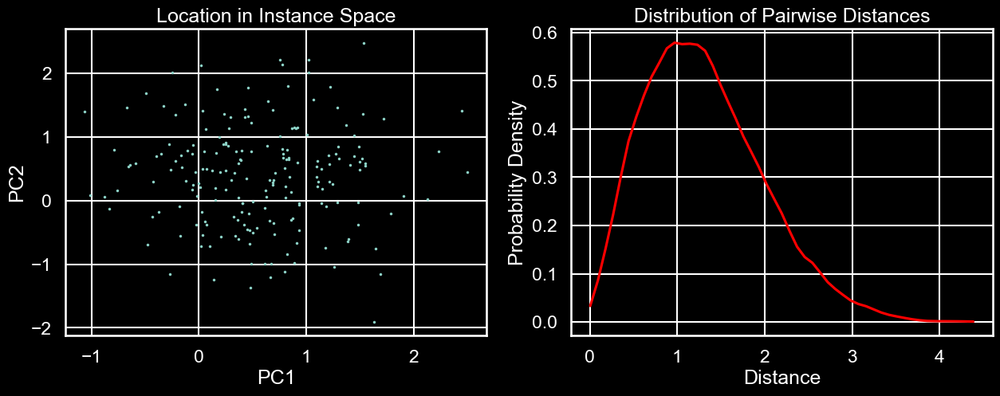

In [770]:
fig, ax = plt.subplots(1, 2, figsize=(15,5))
ax[0].scatter(embedding_test_point[:,0], embedding_test_point[:,1], s=1)
ax[0].set_xlabel('PC1')
ax[0].set_ylabel('PC2')
ax[0].set_title('Location in Instance Space')
ax[1].plot(x_same, density_same(x_same), color='red', label='$\Delta \mu = 5\%$')
ax[1].set_xlabel('Distance')
ax[1].set_ylabel('Probability Density')
ax[1].set_title('Distribution of Pairwise Distances')
plt.show()

Now lets look at 90% difference in mu on either side

In [792]:
np.random.seed(0)
eta = 0.5
num_samples = 200
mu_centre = np.tile(-1, 100) # centre value
mu_neg = np.tile(-1.9, 100) # delta mu is 5% in negative direction
mu_pos = np.tile(-0.1, 100) # delta mu is 5% in positive direction
mus = np.concatenate((mu_neg, mu_centre, mu_pos)) # NOTE ORDER 
sols_test_list = list()
dt = 0.01
tspan = np.arange(0, 55, dt)
for mu in mus:
    def f(state, t):
        x, y = state[0], state[1]
        dxdt = -y + (mu - x **2 - y**2) * x
        dydt = x + (mu - x ** 2 - y **2) * y
        return dxdt, dydt
    ic = np.array(np.random.uniform(size=2)) # uniform random initial conditions
    gw = lambda y, t: eta * np.identity(ic.shape[0]) # noise is relative to ic's 
    fw = lambda y, t: np.array(f(y,t))
    sol = sdeint.itoint(fw, gw, np.array(ic), tspan)
    sols_test_list.append(sol[500:]) # cut out first 500 time points

In [793]:
TS_test2 = np.array([sols_test_list[i][:,0] for i in range(len(sols_test_list))]) # extract x component
FEATURES_TEST2 = np.array([catch22.catch22_all(TS_test2[i,:])['values'] for i in range(len(sols_test_list))])

In [794]:
iqr_scaled_test2 = rs.transform(FEATURES_TEST2)
sigmoidal_iqr_test2 = np.zeros(iqr_scaled_test2.shape)
for feature in range(22):
    x = iqr_scaled_test2[:,feature]
    sigmoidal_iqr_test2[:, feature] = sigmoid(x, 1.35)
zscr_sigmoid_iqr_test2 = ss.transform(sigmoidal_iqr_test2)

In [795]:
embedding_test_point2 = pca_reducer.transform(zscr_sigmoid_iqr_test2)

In [796]:
distances_close_neg = embedding_test_point2[:100] # within 5% of mu = -1
distances_close_centre = embedding_test_point2[100:200] 
distances_close_pos = embedding_test_point2[200:300] 
distances_close_1 = pairwise_distances(distances_close_neg, distances_close_centre, metric='euclidean')
distances_close_2 = pairwise_distances(distances_close_pos, distances_close_centre, metric='euclidean')
distances_close_1 = distances_close_1.reshape(distances_close_1.shape[0]**2,)
distances_close_2 = distances_close_2.reshape(distances_close_2.shape[0]**2,)
distances_close = np.concatenate((distances_close_1, distances_close_2))
distances_close = distances_close[distances_close != 0]
n_close, x_close = np.histogram(distances_close, density=True, bins=50)
density_close = stats.gaussian_kde(distances_close)

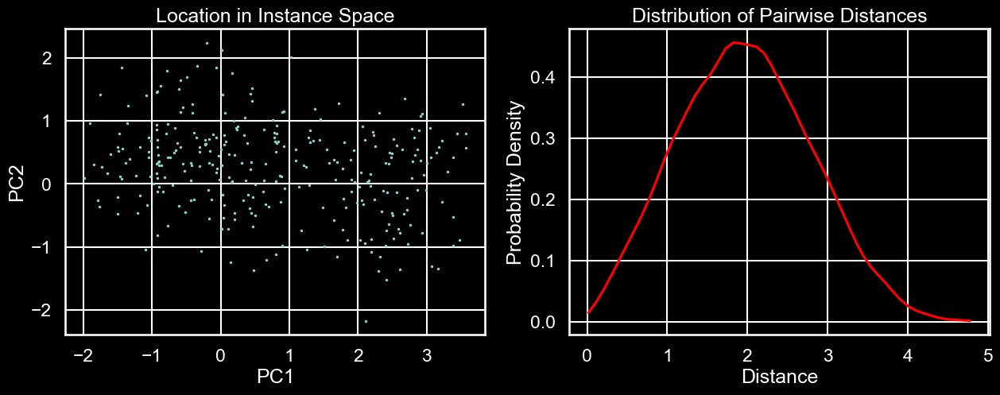

In [797]:
fig, ax = plt.subplots(1, 2, figsize=(15,5))
ax[0].scatter(embedding_test_point2[:,0], embedding_test_point2[:,1], s=1)
ax[0].set_xlabel('PC1')
ax[0].set_ylabel('PC2')
ax[0].set_title('Location in Instance Space')
ax[1].plot(x_close, density_close(x_close), color='red', label='$\Delta \mu = 5\%$')
ax[1].set_xlabel('Distance')
ax[1].set_ylabel('Probability Density')
ax[1].set_title('Distribution of Pairwise Distances')
plt.show()

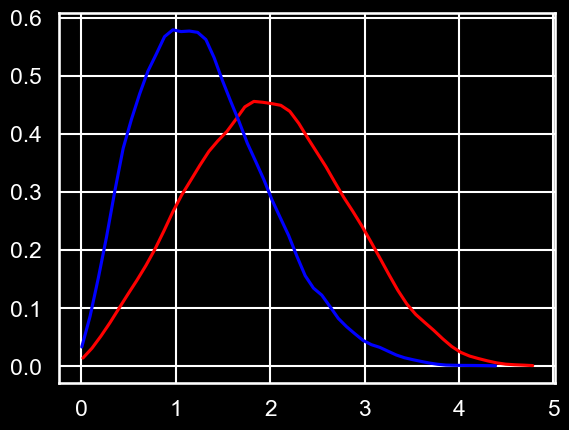

In [798]:
plt.plot(x_close, density_close(x_close), color='red')
plt.plot(x_same, density_same(x_same), color='blue')